### Import

In [310]:
%config InlineBackend.figure_format = 'retina' 
import pandas as pd
import numpy as np 
import chart_studio.plotly as py 
import cufflinks as cf
import seaborn as sns 
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs , init_notebook_mode,plot,iplot
init_notebook_mode(connected = True)

cf.go_offline()


### Basics

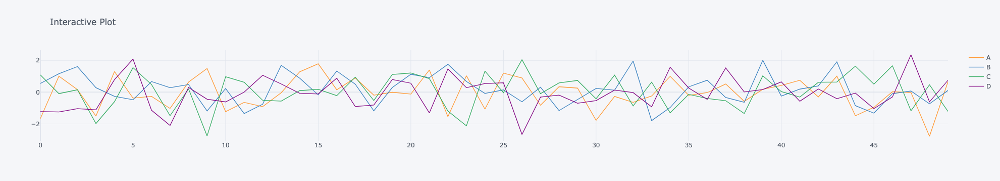

In [313]:
arr_1 = np.random.randn(50,4)
df_1  = pd.DataFrame(arr_1, columns = ['A','B','C','D'])
df_1.head()
df_1.iplot(title = "Interactive Plot")
# df_1.iplot(kind='scatter', mode='markers', x='A', y='B', size=10, title="Interactive Scatter Plot")


### Line Plots

In [316]:
df_stocks

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708
...,...,...,...,...,...,...,...
100,2019-12-02,1.216280,1.546914,1.425061,1.075997,1.463641,1.720717
101,2019-12-09,1.222821,1.572286,1.432660,1.038855,1.421496,1.752239
102,2019-12-16,1.224418,1.596800,1.453455,1.104094,1.604362,1.784896
103,2019-12-23,1.226504,1.656000,1.521226,1.113728,1.567170,1.802472


In [318]:
df_stocks.describe()

,GOOG,AAPL,AMZN,FB,NFLX,MSFT
count,105.000000,105.000000,105.000000,105.000000,105.000000,105.000000
mean,1.046206,1.138536,1.393822,0.945121,1.540559,1.318059
std,0.077776,0.182109,0.140796,0.103350,0.200508,0.220662
min,0.888689,0.847200,1.000000,0.668718,1.000000,0.988547
25%,0.992924,1.000400,1.304091,0.879529,1.398876,1.142873
50%,1.036372,1.095429,1.420278,0.959968,1.560884,1.242431
75%,1.095189,1.236000,1.491702,1.016858,1.701605,1.543599
max,1.226504,1.678000,1.637494,1.123575,1.957665,1.802472


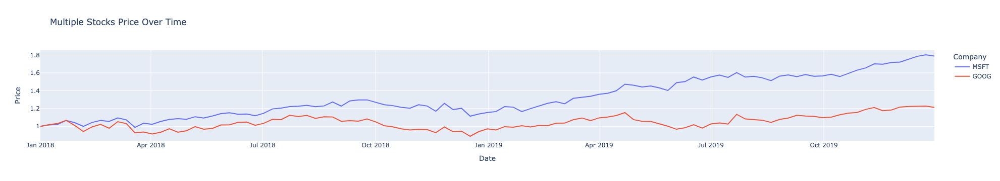

In [320]:
# Allows us to create graph objects for making more customized plot
import plotly.graph_objects as go
df_stocks = px.data.stocks()
fig1  = px.line(
    df_stocks, 
    x = 'date', 
    y  = 'MSFT', 
    labels = {'date':'Date','MSFT':'Price'},
    title='Microsoft Stock Price Over Time'
)
# Multiple line plots
fig2 = px.line(
    df_stocks, 
    x = 'date', 
    y  = ['MSFT', 'GOOG'],
    title='Multiple Stocks Price Over Time',
    labels = {'value': 'Price','variable':'Company','date':'Date'}
)
fig2.show()

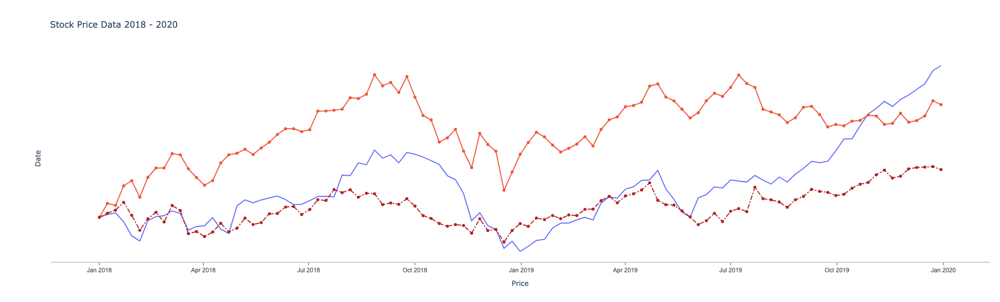

In [322]:
# Create a figure to which I'll add plots
fig = go.Figure()
# You can pull individual columns of data from the dataset and use markers or not
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, 
                        mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, 
                        mode='lines+markers', name='Amazon'))
# You can create custom lines (Dashes : dash, dot, dashdot)
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, 
                        mode='lines+markers', name='Google',
                        line=dict(color='firebrick', width=2, dash='dashdot')))
# Further style the figure
fig.update_layout(title='Stock Price Data 2018 - 2020',
                   xaxis_title='Price', yaxis_title='Date')

# Go crazy styling the figure
fig.update_layout(
    width=1000,  # Width of the figure
    height=600,  # Height of the figure
    # Shows gray line without grid, styling fonts, linewidths and more
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    # Turn off everything on y axis
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=False,
    ),
    autosize=False,
    margin=dict(
        autoexpand=False,
        l=100,
        r=20,
        t=110,
    ),
    showlegend=False,
    plot_bgcolor='white'
)

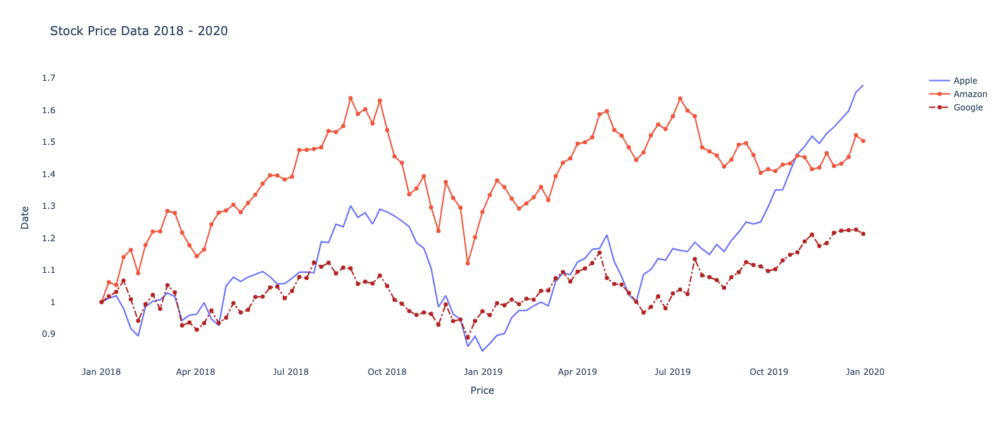

In [336]:
# Create a figure to which I'll add plots
fig = go.Figure()

# Add stock traces
fig.add_trace(go.Scatter(x = df_stocks.date , y = df_stocks.AAPL , mode = 'lines' , name = 'Apple' ))
fig.add_trace(go.Scatter(x = df_stocks.date , y = df_stocks.AMZN , mode = 'lines+markers' , name = 'Amazon' ))
fig.add_trace(go.Scatter(x = df_stocks.date , y = df_stocks.GOOG , mode = 'lines+markers' , name = 'Google',line=dict(color='firebrick', width=2, dash='dashdot')))


# Base layout styling
fig.update_layout(
    title='Stock Price Data 2018 - 2020', 
    xaxis_title='Price',
    yaxis_title='Date',
    width=1000,
    height=600,
    
    # xaxis=dict(
    #     showline=True,
    #     showgrid=False,
    #     showticklabels=True,
    #     linecolor='rgb(204, 204, 204)',
    #     linewidth=2,
    #     ticks='outside',
    #     tickfont=dict(
    #         family='Arial',
    #         size=12,
    #         color='rgb(82, 82, 82)',
    #     ),
    # ),
    
    # yaxis=dict(
    #     showgrid=False,
    #     zeroline=False,
    #     showline=False,
    #     showticklabels=False,
    # ),
    
    autosize=True,
    # margin=dict(
    #     autoexpand=False,
    #     l=80,   # Slightly reduce left margin
    #     r=100,  # Increase right margin to make space for legend
    #     t=100,
    #     b=80
    # ),
    
    showlegend=True,  # ✅ Enable legend
    
    # legend=dict(     # ✅ Customize legend position
    #     x=0.01,       # X position (fraction of width)
    #     y=0.99,          # Y position (top)
    #     bgcolor='rgba(255,255,255,0)',  # Transparent background
    #     bordercolor='black',
    #     borderwidth=1,
    #     font=dict(
    #         family='Arial',
    #         size=12,
    #         color='black'
    #     )
    # ),
    
    plot_bgcolor='white'
)


In [367]:
df_stocks.columns

Index(['date', 'GOOG', 'AAPL', 'AMZN', 'FB', 'NFLX', 'MSFT'], dtype='object')

In [371]:
df_sample_us = px.data.gapminder()

In [373]:
df_sample_us.query("country == 'United States'")

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
1608,United States,Americas,1952,68.440,157553000,13990.48208,USA,840
1609,United States,Americas,1957,69.490,171984000,14847.12712,USA,840
1610,United States,Americas,1962,70.210,186538000,16173.14586,USA,840
1611,United States,Americas,1967,70.760,198712000,19530.36557,USA,840
1612,United States,Americas,1972,71.340,209896000,21806.03594,USA,840
1613,United States,Americas,1977,73.380,220239000,24072.63213,USA,840
1614,United States,Americas,1982,74.650,232187835,25009.55914,USA,840
1615,United States,Americas,1987,75.020,242803533,29884.35041,USA,840
1616,United States,Americas,1992,76.090,256894189,32003.93224,USA,840
1617,United States,Americas,1997,76.810,272911760,35767.43303,USA,840


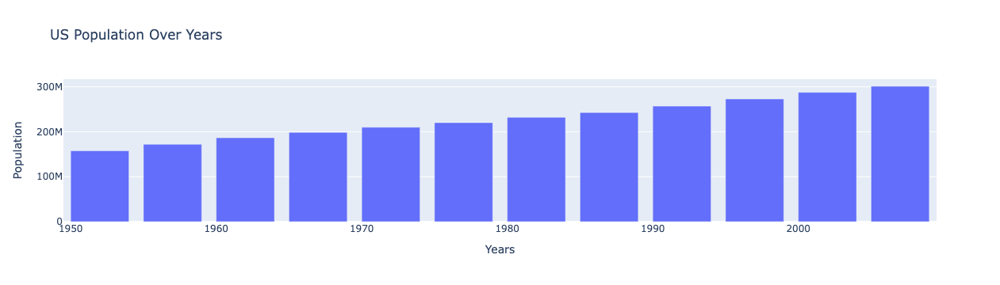

In [417]:
# Get population change in US by querying for US data
df_us = px.data.gapminder().query("country == 'United States'")
# px.bar(df_us, x='year', y='pop',title = 'US Population Over Years')
px.bar(df_us,x = 'year' , y = 'pop' , title = 'US Population Over Years',labels = {'pop':'Population','year':'Years'})

In [396]:
df_tips = px.data.tips()


In [398]:
df_tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


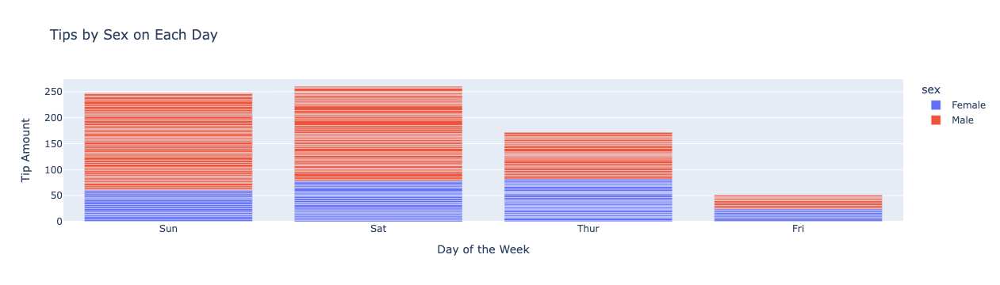

In [425]:
# Create a stacked bar with more customization
df_tips = px.data.tips()
px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on Each Day',
      labels={'tip': 'Tip Amount', 'day': 'Day of the Week'})

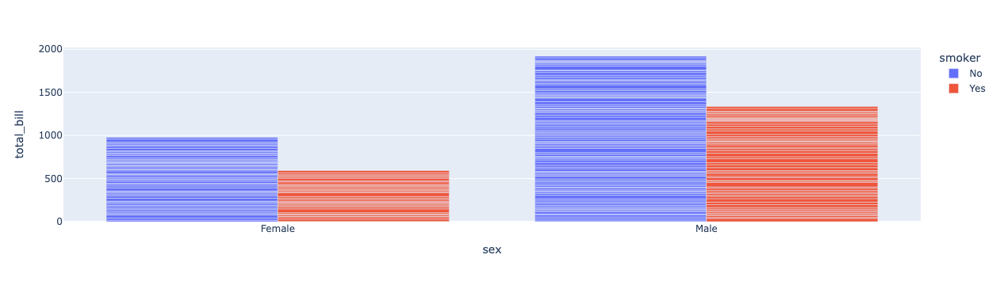

In [406]:
# Place bars next to each other
px.bar(df_tips, x="sex", y="total_bill",
             color='smoker', barmode='group')

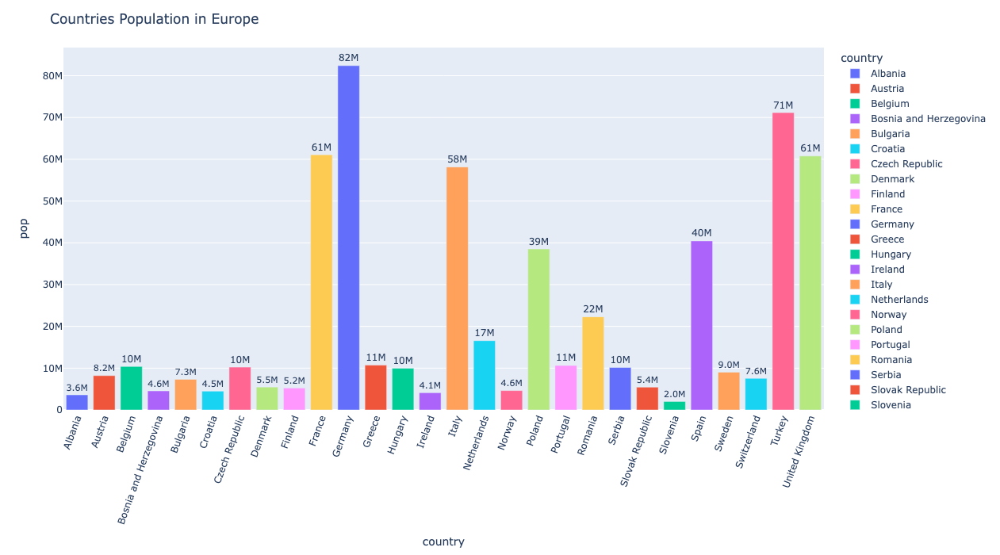

In [479]:
# Display pop data for countries in Europe in 2007 greater than 2000000
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and  pop > 2.e6")
fig = px.bar(df_europe,x = 'country' , y= 'pop' , text = 'pop', color = 'country')
# fig.show()
# Put bar total value above bars with 2 values of precision
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
# Set fontsize and uniformtext_mode='hide' says to hide the text if it won't fit
fig.update_layout(uniformtext_minsize=8)
# # Rotate labels 45 degrees
fig.update_layout(xaxis_tickangle=-70,width = 1300 ,height = 700,title = 'Countries Population in Europe')

### Scatter Plot

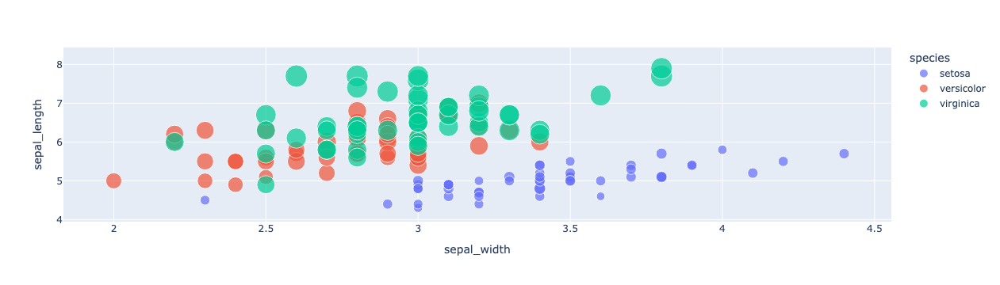

In [484]:
# Use included Iris data set
df_iris = px.data.iris()
# Create a scatter plot by defining x, y, different color for count of provided
# column, size based on supplied column and additional data to display on hover
px.scatter(df_iris, x="sepal_width", y="sepal_length", color="species",
                 size='petal_length', hover_data=['petal_width'])


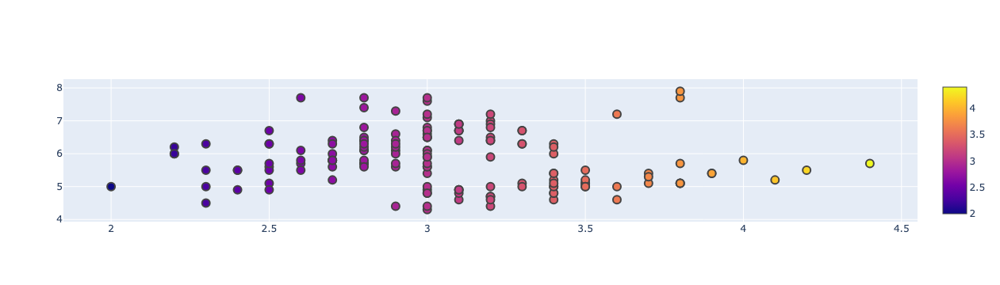

In [488]:

# Create a customized scatter with black marker edges with line width 2, opaque
# and colored based on width. Also show a scale on the right
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width, y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species,
    marker=dict(showscale=True)
))
fig.update_traces(marker_line_width=2, marker_size=10)
fig

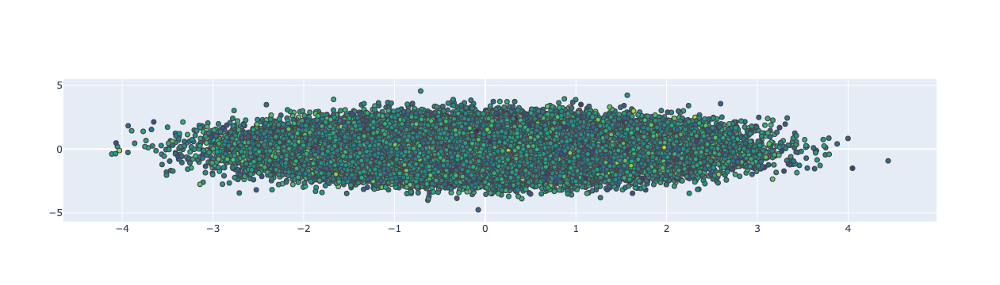

In [486]:
# Working with a lot of data use Scattergl
fig = go.Figure(data=go.Scattergl(
    x = np.random.randn(100000),
    y = np.random.randn(100000),
    mode='markers',
    marker=dict(
        color=np.random.randn(100000),
        colorscale='Viridis',
        line_width=1
    )
))
fig